In [1]:
#import numpy, scipy, math and astropy libraries
import numpy as np
import scipy as sp
import math
import astropy

#import rpy2 to allow access to R statistics packages.
import rpy2
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr 
from rpy2.robjects.vectors import StrVector
from rpy2.robjects.vectors import BoolVector
import rpy2.robjects.packages as rpackages # import rpy2's package module
from rpy2.robjects.methods import getmethod
#import rpy2.rpy_classic as rpy
from multipledispatch import dispatch
from functools import partial
from rpy2.robjects.methods import RS4   

#import functions for reading data tables
from astropy.io import ascii
from astropy.table import Table, Column

#import packages that stephanie's fit_rossby.py scripts rely on
import emcee
import corner

#load functions originally written by Stephanie Douglas for her 2014 paper, 
#(see the repo at https://github.com/stephtdouglas/fit-rossby)
#and subsequently modified by KRC in 2019, as stored in fit_rossby.py in my fork
%run ../scripts/fit_rossby_log.py

#also load a copy of this file, which allows a dual power law fit to be run.
%run ../scripts/dual_power_law.py

%run ../scripts/dual_power_law_constrained.py

In [2]:
#import graphics packages
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.mlab as mlab
import matplotlib.colorbar as cb

#set plotting defaults to values that make plots look publication ready
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('pdf', 'png')
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['figure.autolayout'] = False
plt.rcParams['figure.figsize'] = 11, 7
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['font.size'] = 14
plt.rcParams['lines.linewidth'] = 1.5
plt.rcParams['lines.markersize'] = 4
plt.rcParams['legend.fontsize'] = 11
matplotlib.rcParams['xtick.direction'] = 'out'
matplotlib.rcParams['ytick.direction'] = 'out'

#ensure that plots show up in our notebook (comment this out if converting to a script)
%matplotlib inline

In [3]:
#set up a list of the paths that change between laptop & desktop
#WrightData = Table.read("/Users/kcovey/Dropbox/python/fit-rossby/data/nature18638-f1_KRCedits.csv", data_start=1, delimiter=',')
WrightData = Table.read("/Users/coveyk/Dropbox/python/fit-rossby/data/nature18638-f1_KRCedits.csv", data_start=1, delimiter=',')

#read in Enza's data Table (after adjusting file format and switching some encodings on minus signs)
#prior plots were derived from Final_Results_wMKs.csv
#dataTable = Table.read("/Users/coveyk/Dropbox/python/fit-rossby/data/Very_Last_Results.csv", data_start=1, delimiter=',')
#dataTable = Table.read("/Users/kcovey/Dropbox/python/fit-rossby/data/Very_Last_Results.csv", data_start=1, delimiter=',')
#dataTable = Table.read("/Users/kcovey/Dropbox/python/fit-rossby/data/Very_Last_Results_Wr11_16_18_Stz_Gonz_Mag_KEVIN.csv", data_start=1, delimiter=',')
dataTable = Table.read("/Users/coveyk/Dropbox/python/fit-rossby/data/Enza_file_Nov1.csv", data_start=1, delimiter=',')
#dataTable.info()
FinalRossbys = Table.read("/Users/coveyk/Dropbox/python/fit-rossby/data/CS11_Wr18_Ro.csv", data_start=1, delimiter=',')

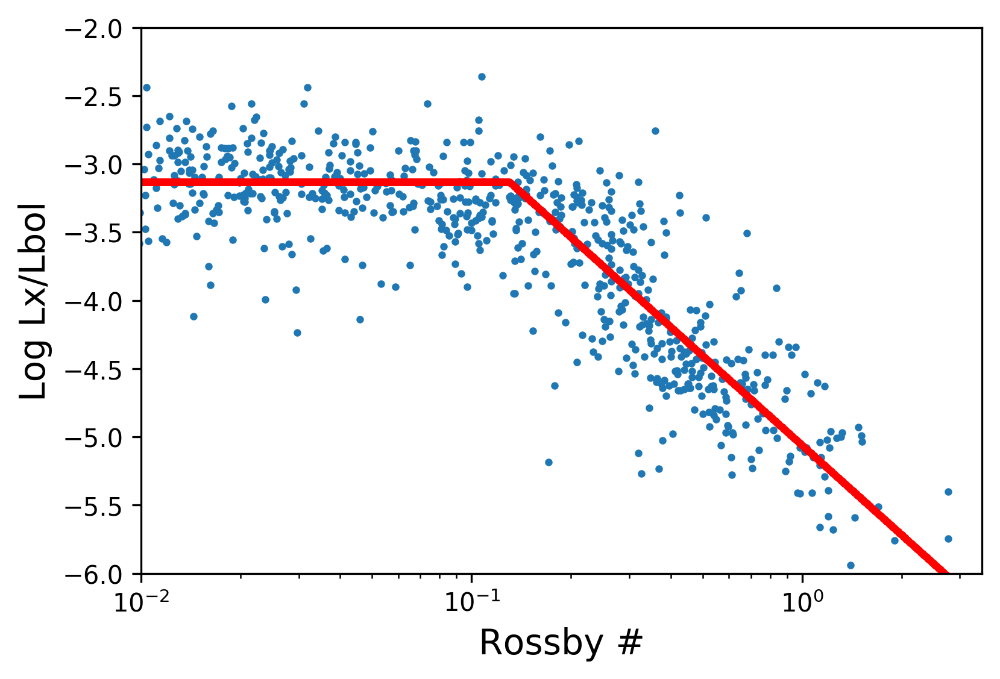

In [4]:
#read in Wright 2011 data Table that Enza provided 
num_WrightSources = len(np.asarray(WrightData['RA']))
#print(num_WrightSources)

#plot the Rossby plot for the Wright 2011 data 
plt.scatter(WrightData['Rossby_number'], WrightData['log(Lx/Lbol)'], marker = '.')

#overlay the best fit power law parameters from Wright 2011
fake_rossbys = np.logspace(-2, 0.5, 1000)
Wright2011Law = rossby_model_log([-3.13, 0.13, -2.18], fake_rossbys)
plt.scatter(fake_rossbys, Wright2011Law, marker = '.', color = 'red')

#set up all the figure parameters
plt.xscale('log')
#plt.yscale('log')
xlabel = plt.xlabel('Rossby #') 
ylabel = plt.ylabel('Log Lx/Lbol')
plt.axis([10**(-2),3.5,-6,-2])

plt.savefig('wright_rossby.png', bbox_inches='tight') 

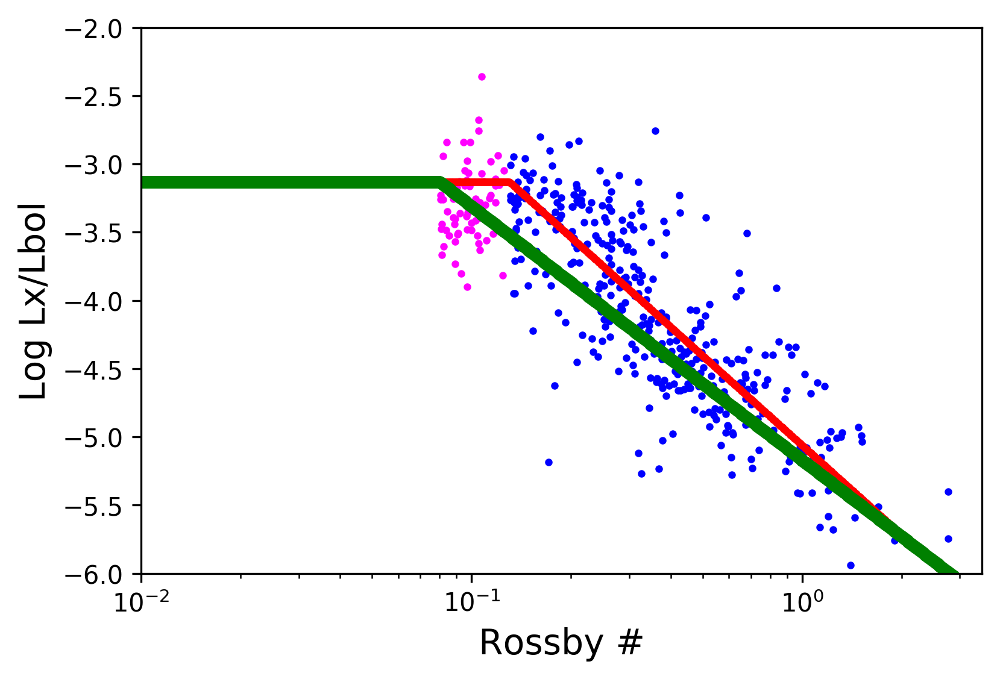

In [5]:
#now try fitting the Wright data and see if that is what we recover.

#first truncate the powerlaw at the point that Wright truncates it: Ro = 0.13
slow_Wright_rossbys = WrightData['Rossby_number'][(np.asarray(WrightData['Rossby_number']) > 0.13)]
slow_Wright_fluxes = WrightData['log(Lx/Lbol)'][(np.asarray(WrightData['Rossby_number']) > 0.13)]
num_slow_Wright = len(slow_Wright_fluxes)
slow_Wright_Flags = np.full(num_slow_Wright, False)

medium_Wright_rossbys = WrightData['Rossby_number'][(np.asarray(WrightData['Rossby_number']) > 0.08) & (np.asarray(WrightData['Rossby_number']) < 0.13)]
medium_Wright_fluxes = WrightData['log(Lx/Lbol)'][(np.asarray(WrightData['Rossby_number']) > 0.08) & (np.asarray(WrightData['Rossby_number']) < 0.13)]

#plot just the unsaturated regime
plt.scatter(slow_Wright_rossbys, slow_Wright_fluxes, marker = '.', color = 'blue')
plt.scatter(medium_Wright_rossbys, medium_Wright_fluxes, marker = '.', color = 'magenta')

plt.scatter(fake_rossbys, Wright2011Law, marker = '.', color = 'red')
ShallowWright2011Law = rossby_model_log([-3.13, 0.08, -1.86], fake_rossbys)
plt.scatter(fake_rossbys, ShallowWright2011Law, linestyle = '-', color = 'green')

#set up all the figure parameters
plt.xscale('log')
#plt.yscale('log')
xlabel = plt.xlabel('Rossby #') 
ylabel = plt.ylabel('Log Lx/Lbol')
plt.axis([10**(-2),3.5,-6,-2])

plt.savefig('wright_rossby_wfit.png', bbox_inches='tight') 

In [6]:
#now try to do fit using R to do an upper limit sensitive approach

# import R's "base" package
base = importr('base')

# import R's "utils" package
utils = rpackages.importr('utils') # import R's utility package

#install NADA once, then just import
#utils.install_packages('NADA')
utils.chooseCRANmirror(ind=1) # select the first CRAN mirror in the list for downloading packages
nada = rpackages.importr('NADA') # import R's utility package

#now load the cenken package that we want to use to do the line fitting
cenken = robjects.r['cenken']

slow_Wright_rossbys = WrightData['Rossby_number'][(np.asarray(WrightData['Rossby_number']) > 0.08)]
slow_Wright_fluxes = WrightData['log(Lx/Lbol)'][(np.asarray(WrightData['Rossby_number']) > 0.08)]
num_slow_Wright = len(slow_Wright_fluxes)
slow_Wright_Flags = np.full(num_slow_Wright, False)
#set a couple upper limit flags to true to test if that kills the intercept
test_Wright_Flags = np.copy(slow_Wright_Flags)
test_Wright_Flags[3:5] = True

#since that worked ok, now save the vectors to send to r (and convert rossbys to log space, since that is what we want to fit)
wright_cenken_rossbys = robjects.FloatVector(np.log10(slow_Wright_rossbys) )
wright_cenken_fluxes = robjects.FloatVector(slow_Wright_fluxes)
wright_cenken_Flags = robjects.BoolVector(slow_Wright_Flags)
wright_test_Flags = robjects.BoolVector(test_Wright_Flags)

#run the fit!  (remember that cenken wants y values before xs)
Wright_cenkenout = cenken(wright_cenken_fluxes, wright_cenken_Flags, wright_cenken_rossbys, wright_test_Flags)
print(Wright_cenkenout)

#fit gives slope of -2.17 when Wright's turnover (R_sat = 0.13) is used; 
#slope drops to -1.86 when closer turnover (R_sat = 0.08) is used.

slope 
[1] -1.86232

intercept 
[1] -5.011403

tau 
[1] -0.6362188

p 
[1] 0




In [ ]:
#now fit Wright data using the MCMC approach
#Set the starting parameters close to, but not exactly at, the Wright et al. best fit values
start_p = np.asarray([-3.2, 0.15, -2., 0.2])

# run the emcee wrapper function 
samples = run_rossby_fit(start_p, np.asarray(WrightData['Rossby_number']), np.asarray(WrightData['log(Lx/Lbol)']), np.ones(num_WrightSources)*0.2 )

# Plot the output
plot_rossby_log(samples, np.asarray(WrightData['Rossby_number']), np.asarray(WrightData['log(Lx/Lbol)']), np.ones(num_WrightSources)*0.2, plotfilename = 'Wright_rossby_MCMCfit.png', sampleName = 'Wright+ 2011')

In [ ]:
# Make a triangle plot 

# Set up the parameters of the problem.
ndim, nsamples = 4, len(samples) 

sl_mcmc = quantile(samples[:,0],[.16,.5,.84])
to_mcmc = quantile(samples[:,1],[.16,.5,.84])
be_mcmc = quantile(samples[:,2],[.16,.5,.84])
var_mcmc = quantile(samples[:,3],[.16,.5,.84])


bestFit = [sl_mcmc[1][1], to_mcmc[1][1], be_mcmc[1][1], var_mcmc[1][1]]

# Plot it.
figure = corner.corner(samples, labels=['sat_level (x10$^{-3}$)','turnover','beta', 'f'],
                       quantiles=[0.16, 0.5, 0.84],
                       show_titles=True, title_kwargs={"fontsize": 12}, truths = bestFit)


# Uncomment to save the plot
plt.savefig('Wright_rossby_corner.png')

## Dual power law fit via emcee for all detections in the sample & adopting Wright 2018 Rossbys

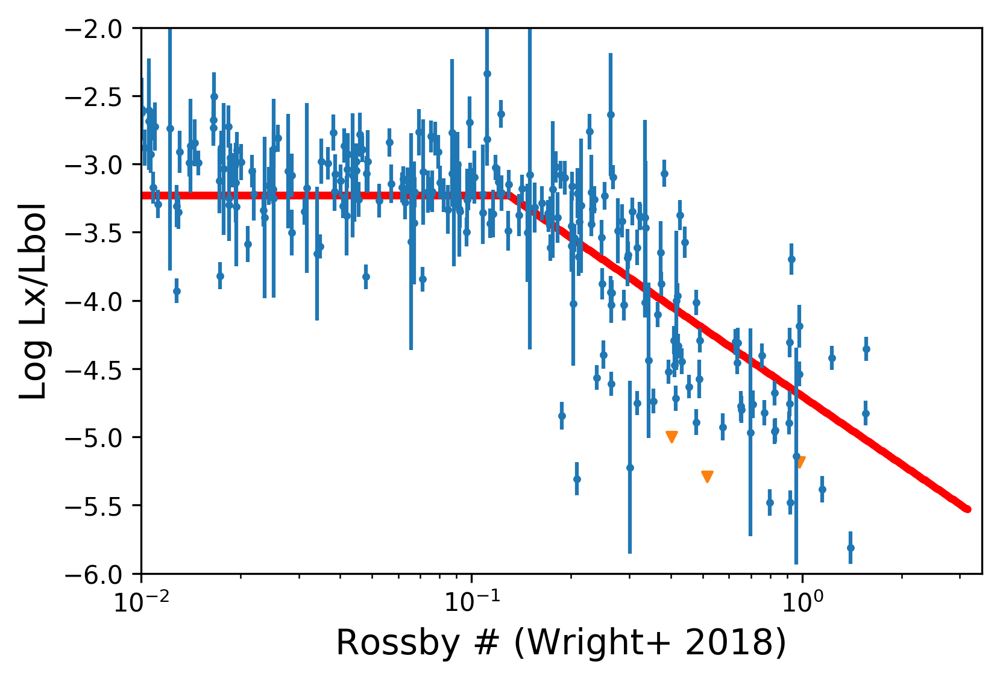

In [7]:
#identify the true detections and the upper limits in the dataset
upperlimits = np.where(FinalRossbys['UPP_LIM'] == 1)
detections = np.where(FinalRossbys['UPP_LIM'] == 0)

#plot Enza's data
plt.scatter(FinalRossbys['Ro_Wr18'][detections], FinalRossbys['LxLbol'][detections], marker = '.')
plt.errorbar(FinalRossbys['Ro_Wr18'][detections], FinalRossbys['LxLbol'][detections], FinalRossbys['eLxLbol'][detections], fmt = '.')
plt.scatter(FinalRossbys['Ro_Wr18'][upperlimits], FinalRossbys['LxLbol'][upperlimits], marker = 'v')

plt.xscale('log')
#plt.yscale('log')
xlabel = plt.xlabel('Rossby # (Wright+ 2018)') 
ylabel = plt.ylabel('Log Lx/Lbol')
plt.axis([10**(-2),3.5,-6,-2])

#check that the log version of the model function is working by calculating model values 
#for the set of fake Rossby's that we created to test the Wright Data
#fake_Log_lxlbols_shallow = rossby_model_log([-3.23, 0.08, -1.625], fake_rossbys)
#plt.scatter(fake_rossbys, fake_Log_lxlbols_shallow, marker = '.', color = 'green')
fake_Log_lxlbols_steep = rossby_model_log([-3.23, 0.13, -1.66], fake_rossbys)
plt.scatter(fake_rossbys, fake_Log_lxlbols_steep, marker = '.', color = 'red')

plt.savefig('enza_Wright2018_Rossby.png', bbox_inches='tight') 

intercept constant=-4.8436294 +0.0907148/-0.0880218
turnover=0.129 +0.015/-0.018
beta1=-0.211 +0.077/-0.078
beta2=-1.841 +0.162/-0.151
var=-2.306 +0.053/-0.055


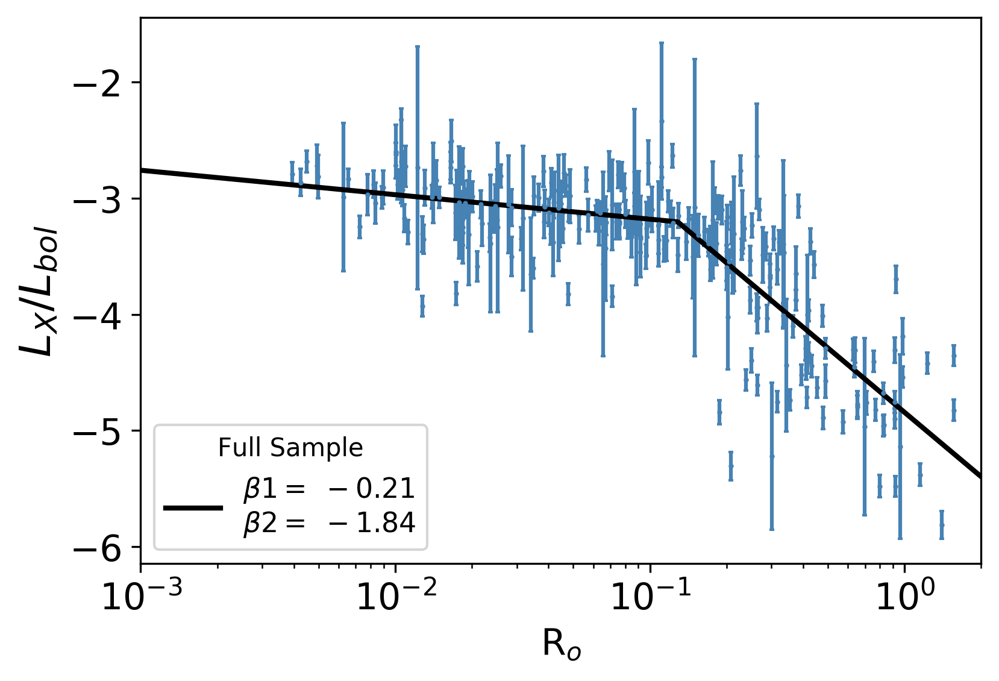

In [8]:
# Decide on your starting parameters
start_p = np.asarray([-4.75, 0.15, -0.15, -3.1, -2.3])

# run the emcee wrapper function -- include all data (including lower limits)
samples = run_dual_fit(start_p, np.asarray(FinalRossbys['Ro_Wr18'][detections]), np.asarray(FinalRossbys['LxLbol'][detections]), np.asarray(FinalRossbys['eLxLbol'][detections]) )
#returns: sat = -3.09, turnover = 0.078, beta = -1.54

# run the emcee wrapper function -- include just detections (exclude lower limits)
#samples = run_rossby_fit(start_p, np.asarray(dataTable['Ro'][detections]), np.asarray(dataTable['LxLbol_TRUE'][detections]), np.asarray(dataTable['e_LxLbol_KRC_use'][detections]) )
#returns: sat = -3.09, turnover = 0.079, beta = -1.57

# Plot the output
plot_dual_fit(samples, np.asarray(FinalRossbys['Ro_Wr18'][detections]), np.asarray(FinalRossbys['LxLbol'][detections]), np.asarray(FinalRossbys['eLxLbol'][detections]) , plotfilename = 'enza_Wright2018_dual_fit.png', sampleName = 'Full Sample')

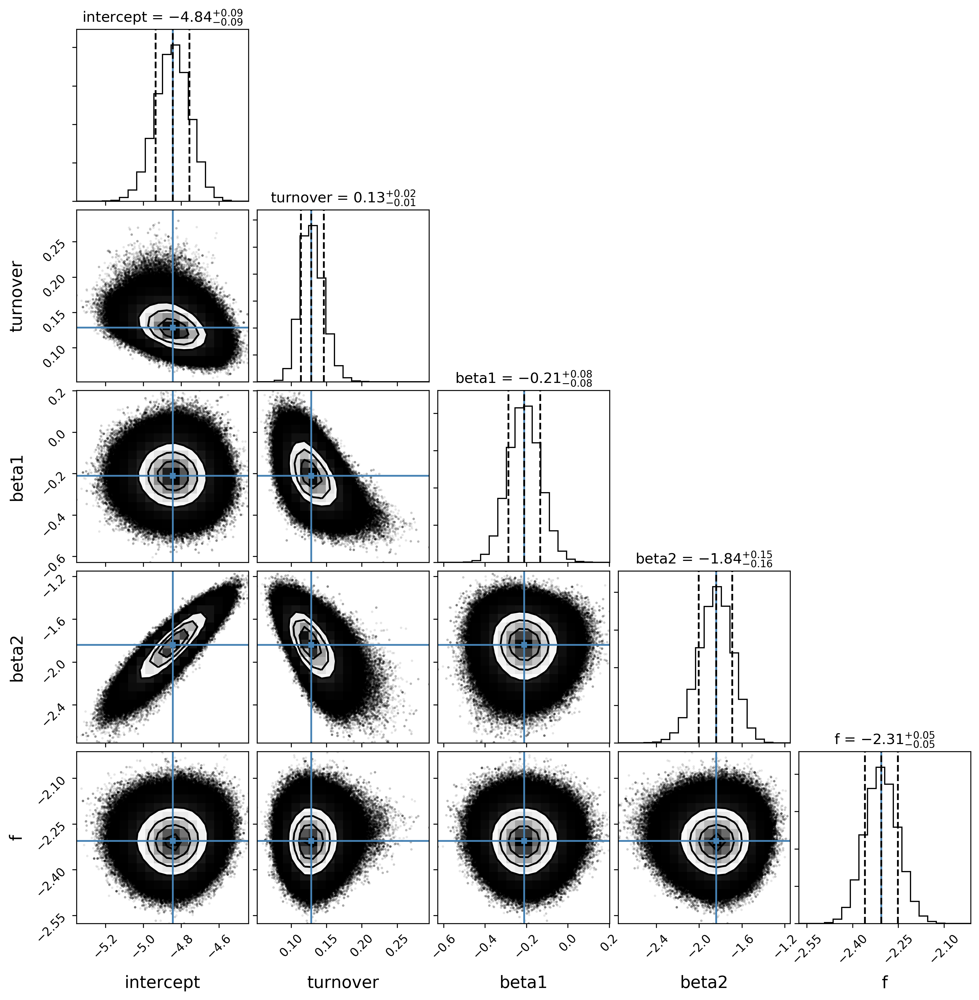

In [9]:
# Make a triangle plot 

# Set up the parameters of the problem.
ndim, nsamples = 5, len(samples) 

ic_mcmc = quantile(samples[:,0],[.16,.5,.84])
to_mcmc = quantile(samples[:,1],[.16,.5,.84])
beta1_mcmc = quantile(samples[:,2],[.16,.5,.84])
beta2_mcmc = quantile(samples[:,3],[.16,.5,.84])
var_mcmc = quantile(samples[:,4],[.16,.5,.84])

bestFit = [ic_mcmc[1][1], to_mcmc[1][1], beta1_mcmc[1][1], beta2_mcmc[1][1], var_mcmc[1][1]]

# Plot it.
figure = corner.corner(samples, labels=['intercept','turnover','beta1', 'beta2', 'f'],
                       quantiles=[0.16, 0.5, 0.84],
                       show_titles=True, title_kwargs={"fontsize": 12}, truths = bestFit)

# Uncomment to save the plot
plt.savefig('enza_Wright2018_dual_fit_corner.png')

In [10]:
slow_Wright18_rossbys = FinalRossbys['Ro_Wr18'][(np.asarray(FinalRossbys['Ro_Wr18']) > 0.129)]
slow_Wright18_fluxes = FinalRossbys['LxLbol'][(np.asarray(FinalRossbys['Ro_Wr18']) > 0.129)]
num_slow_Wright18 = len(slow_Wright18_fluxes)
slow_Wright18_Flags = np.full(num_slow_Wright18, False)
#set a couple upper limit flags to true to test if that kills the intercept
test_Wright18_Flags = np.copy(slow_Wright18_Flags)
test_Wright18_Flags[0:2] = True

#since that worked ok, now save the vectors to send to r (and convert rossbys to log space, since that is what we want to fit)
wright18_cenken_rossbys = robjects.FloatVector(np.log10(slow_Wright18_rossbys) )
wright18_cenken_fluxes = robjects.FloatVector(slow_Wright18_fluxes)
wright18_cenken_Flags = robjects.BoolVector(slow_Wright18_Flags)
wright18_test_Flags = robjects.BoolVector(test_Wright18_Flags)

#print(wright18_cenken_rossbys)
#print(wright18_cenken_fluxes)


#run the fit!  (remember that cenken wants y values before xs)
Wright18_cenkenout = cenken(wright18_cenken_fluxes, wright18_cenken_Flags, wright18_cenken_rossbys, wright18_test_Flags)
print(Wright18_cenkenout)

#fit gives slope of -2.17 when Wright's turnover (R_sat = 0.13) is used; 
#slope drops to -1.86 when closer turnover (R_sat = 0.08) is used.

slope 
[1] -1.995674

intercept 
[1] -4.868649

tau 
[1] -0.492015

p 
[1] 3.330669e-14




/Users/coveyk/anaconda/lib/python3.6/site-packages/emcee/ensemble.py:335: RuntimeWarning: invalid value encountered in subtract
  lnpdiff = (self.dim - 1.) * np.log(zz) + newlnprob - lnprob0
/Users/coveyk/anaconda/lib/python3.6/site-packages/emcee/ensemble.py:336: RuntimeWarning: invalid value encountered in greater
  accept = (lnpdiff > np.log(self._random.rand(len(lnpdiff))))


intercept constant=-4.9204994 +0.0465850/-0.0477303
turnover=0.140 +0.013/-0.014
beta1=-0.200 +0.080/-0.069
beta2=-1.994 +0.015/-0.014
var=-2.307 +0.058/-0.059


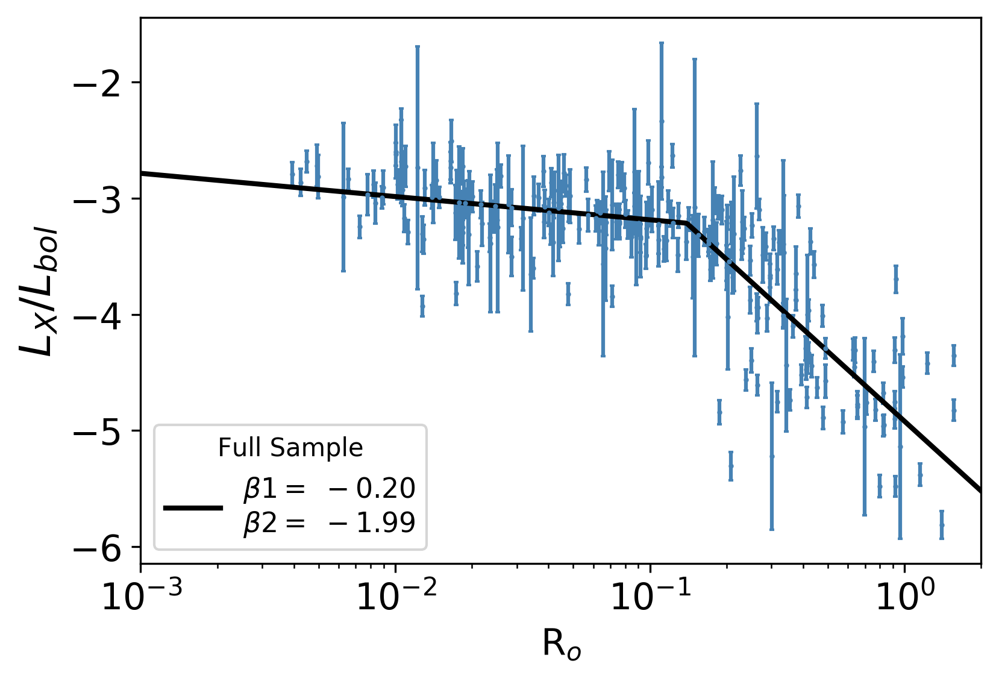

In [23]:
# Decide on your starting parameters
start_p = np.asarray([-4.75, 0.15, -0.15, -1.996, -2.3])

# run the emcee wrapper function -- include all data (including lower limits)
samples = run_dual_fit_constrained(start_p, np.asarray(FinalRossbys['Ro_Wr18'][detections]), np.asarray(FinalRossbys['LxLbol'][detections]), np.asarray(FinalRossbys['eLxLbol'][detections]), -2.016, -1.976 )
#returns: sat = -3.09, turnover = 0.078, beta = -1.54

# run the emcee wrapper function -- include just detections (exclude lower limits)
#samples = run_rossby_fit(start_p, np.asarray(dataTable['Ro'][detections]), np.asarray(dataTable['LxLbol_TRUE'][detections]), np.asarray(dataTable['e_LxLbol_KRC_use'][detections]) )
#returns: sat = -3.09, turnover = 0.079, beta = -1.57

# Plot the output
plot_dual_fit(samples, np.asarray(FinalRossbys['Ro_Wr18'][detections]), np.asarray(FinalRossbys['LxLbol'][detections]), np.asarray(FinalRossbys['eLxLbol'][detections]) , plotfilename = 'enza_Wright2018_dual_fit_constrained.png', sampleName = 'Full Sample')

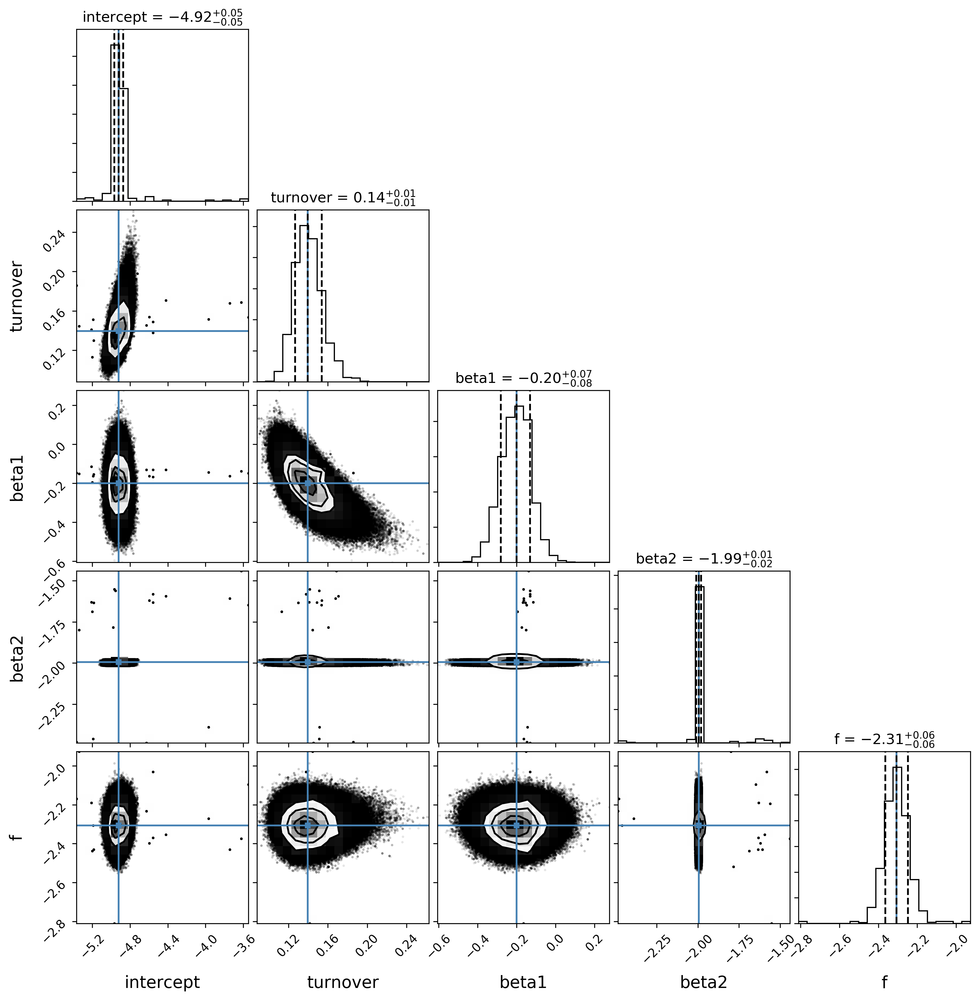

In [24]:
# Make a triangle plot 

# Set up the parameters of the problem.
ndim, nsamples = 5, len(samples) 

ic_mcmc = quantile(samples[:,0],[.16,.5,.84])
to_mcmc = quantile(samples[:,1],[.16,.5,.84])
beta1_mcmc = quantile(samples[:,2],[.16,.5,.84])
beta2_mcmc = quantile(samples[:,3],[.16,.5,.84])
var_mcmc = quantile(samples[:,4],[.16,.5,.84])

bestFit = [ic_mcmc[1][1], to_mcmc[1][1], beta1_mcmc[1][1], beta2_mcmc[1][1], var_mcmc[1][1]]

# Plot it.
figure = corner.corner(samples, labels=['intercept','turnover','beta1', 'beta2', 'f'],
                       quantiles=[0.16, 0.5, 0.84],
                       show_titles=True, title_kwargs={"fontsize": 12}, truths = bestFit)

# Uncomment to save the plot
plt.savefig('enza_Wright2018_dual_fit_corner_constrained.png')

## Dual power law fit via emcee for all detections in the sample & adopting Cranmer & Saar 2011 Rossbys

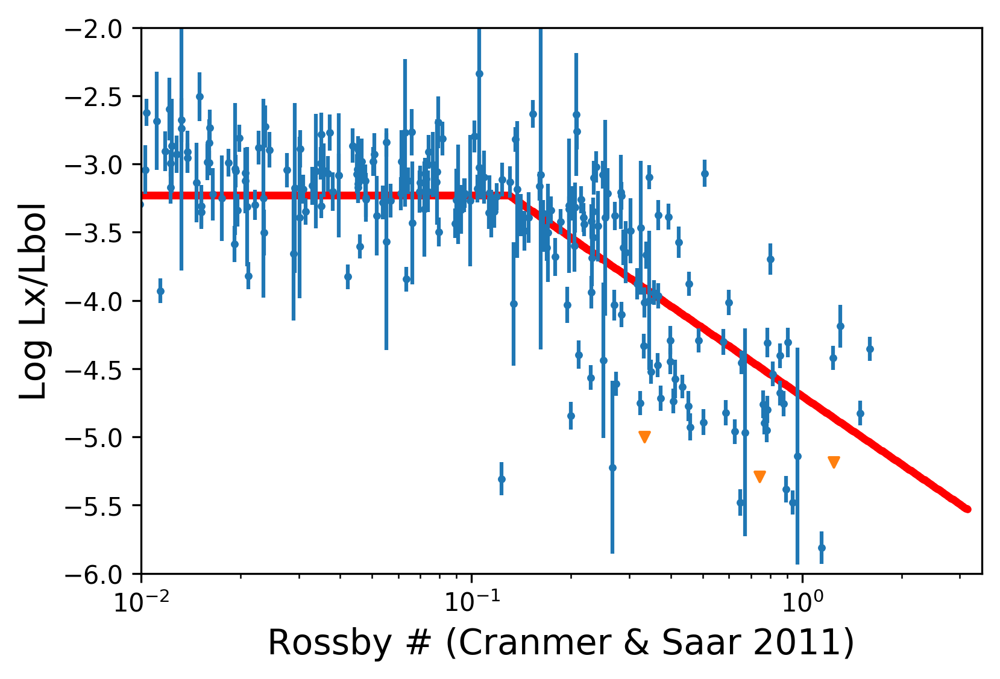

In [13]:
#plot Enza's data
plt.scatter(FinalRossbys['Ro_CS11'][detections], FinalRossbys['LxLbol'][detections], marker = '.')
plt.errorbar(FinalRossbys['Ro_CS11'][detections], FinalRossbys['LxLbol'][detections], FinalRossbys['eLxLbol'][detections], fmt = '.')
plt.scatter(FinalRossbys['Ro_CS11'][upperlimits], FinalRossbys['LxLbol'][upperlimits], marker = 'v')

plt.xscale('log')
#plt.yscale('log')
xlabel = plt.xlabel('Rossby # (Cranmer & Saar 2011)') 
ylabel = plt.ylabel('Log Lx/Lbol')
plt.axis([10**(-2),3.5,-6,-2])

#check that the log version of the model function is working by calculating model values 
#for the set of fake Rossby's that we created to test the Wright Data
#fake_Log_lxlbols_shallow = rossby_model_log([-3.23, 0.08, -1.625], fake_rossbys)
#plt.scatter(fake_rossbys, fake_Log_lxlbols_shallow, marker = '.', color = 'green')
fake_Log_lxlbols_steep = rossby_model_log([-3.23, 0.13, -1.66], fake_rossbys)
plt.scatter(fake_rossbys, fake_Log_lxlbols_steep, marker = '.', color = 'red')

plt.savefig('enza_CS2011_Rossby.png', bbox_inches='tight') 

intercept constant=-4.8342694 +0.1111685/-0.1065529
turnover=0.145 +0.036/-0.026
beta1=-0.300 +0.086/-0.096
beta2=-1.826 +0.224/-0.217
var=-2.222 +0.053/-0.054


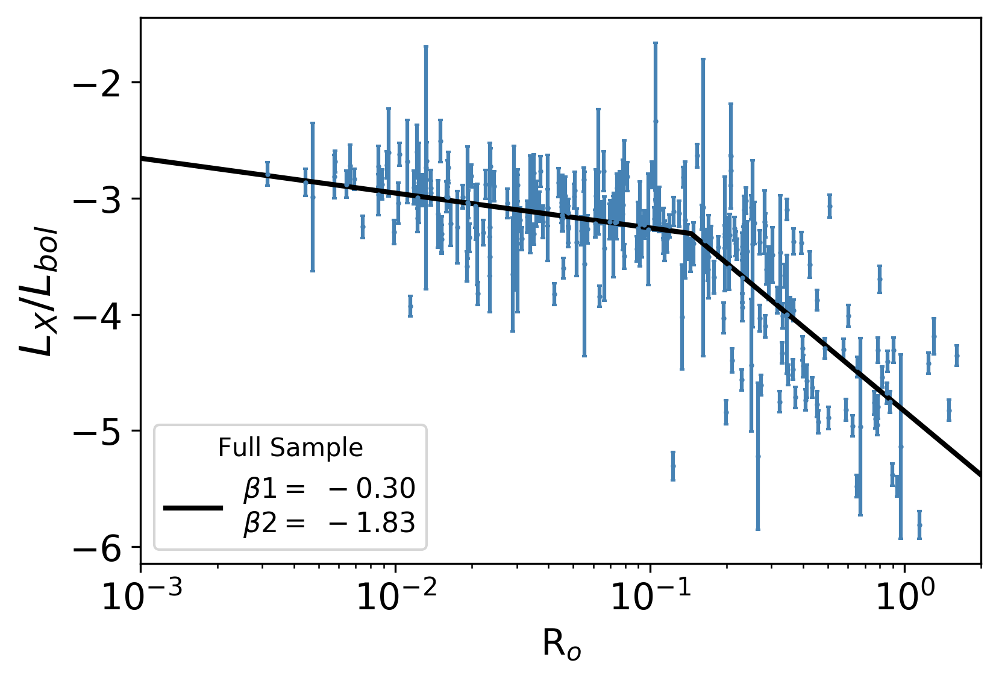

In [14]:
# Decide on your starting parameters
start_p = np.asarray([-4.75, 0.15, -0.15, -2.1, -2.3])

# run the emcee wrapper function -- include all data (including lower limits)
samples = run_dual_fit(start_p, np.asarray(FinalRossbys['Ro_CS11'][detections]), np.asarray(FinalRossbys['LxLbol'][detections]), np.asarray(FinalRossbys['eLxLbol'][detections]) )
#returns: sat = -3.09, turnover = 0.078, beta = -1.54

# run the emcee wrapper function -- include just detections (exclude lower limits)
#samples = run_rossby_fit(start_p, np.asarray(dataTable['Ro'][detections]), np.asarray(dataTable['LxLbol_TRUE'][detections]), np.asarray(dataTable['e_LxLbol_KRC_use'][detections]) )
#returns: sat = -3.09, turnover = 0.079, beta = -1.57

# Plot the output
plot_dual_fit(samples, np.asarray(FinalRossbys['Ro_CS11'][detections]), np.asarray(FinalRossbys['LxLbol'][detections]), np.asarray(FinalRossbys['eLxLbol'][detections]) , plotfilename = 'enza_CranmerSaar2011_dual_fit.png', sampleName = 'Full Sample')

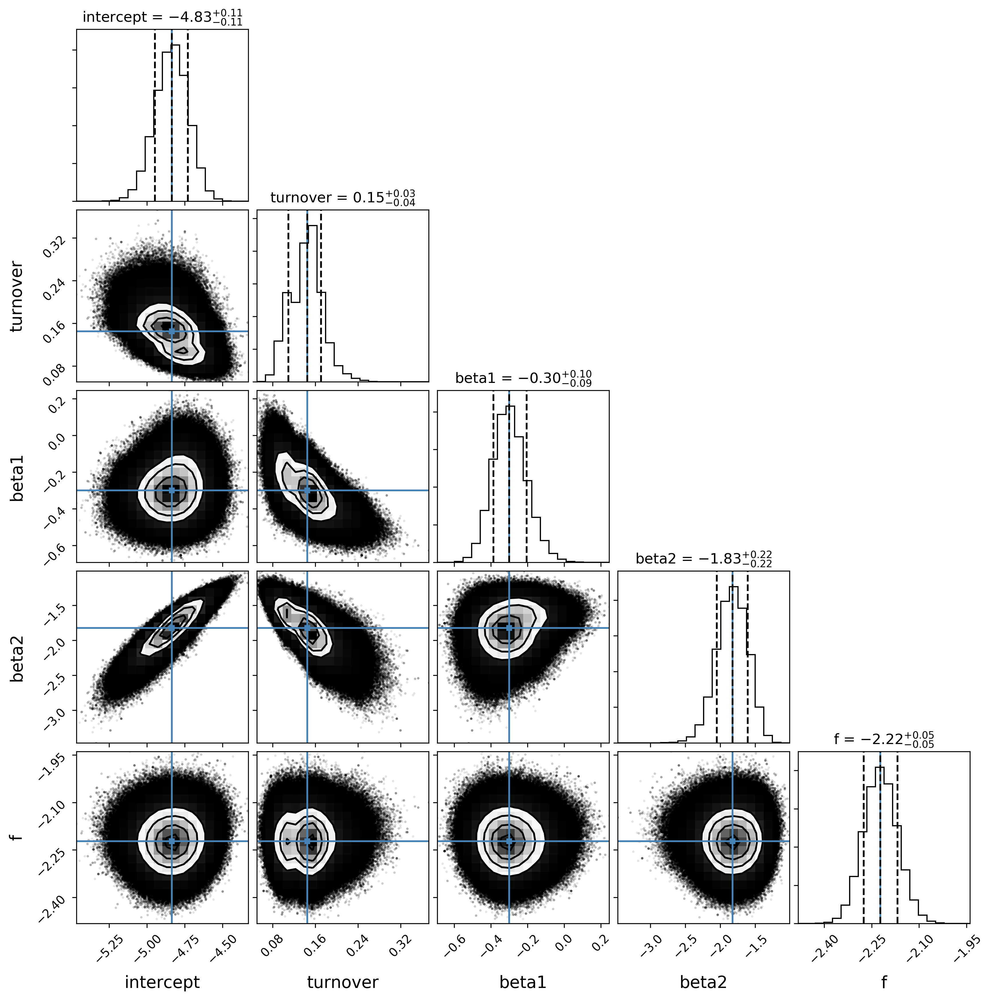

In [15]:
# Make a triangle plot 

# Set up the parameters of the problem.
ndim, nsamples = 5, len(samples) 

ic_mcmc = quantile(samples[:,0],[.16,.5,.84])
to_mcmc = quantile(samples[:,1],[.16,.5,.84])
beta1_mcmc = quantile(samples[:,2],[.16,.5,.84])
beta2_mcmc = quantile(samples[:,3],[.16,.5,.84])
var_mcmc = quantile(samples[:,4],[.16,.5,.84])

bestFit = [ic_mcmc[1][1], to_mcmc[1][1], beta1_mcmc[1][1], beta2_mcmc[1][1], var_mcmc[1][1]]

# Plot it.
figure = corner.corner(samples, labels=['intercept','turnover','beta1', 'beta2', 'f'],
                       quantiles=[0.16, 0.5, 0.84],
                       show_titles=True, title_kwargs={"fontsize": 12}, truths = bestFit)

# Uncomment to save the plot
plt.savefig('enza_CranmerSaar2011_dual_fit_corner.png')

In [19]:
slow_CS11_rossbys = FinalRossbys['Ro_CS11'][(np.asarray(FinalRossbys['Ro_CS11']) > 0.145)]
slow_CS11_fluxes = FinalRossbys['LxLbol'][(np.asarray(FinalRossbys['Ro_CS11']) > 0.145)]
num_slow_CS11 = len(slow_CS11_fluxes)
slow_CS11_Flags = np.full(num_slow_CS11, False)
#set a couple upper limit flags to true to test if that kills the intercept
test_CS11_Flags = np.copy(slow_CS11_Flags)
test_CS11_Flags[0:2] = True

#since that worked ok, now save the vectors to send to r (and convert rossbys to log space, since that is what we want to fit)
CS11_cenken_rossbys = robjects.FloatVector(np.log10(slow_CS11_rossbys) )
CS11_cenken_fluxes = robjects.FloatVector(slow_CS11_fluxes)
CS11_cenken_Flags = robjects.BoolVector(slow_CS11_Flags)
CS11_test_Flags = robjects.BoolVector(test_CS11_Flags)

#run the fit!  (remember that cenken wants y values before xs)
CS11_cenkenout = cenken(CS11_cenken_fluxes, CS11_cenken_Flags, CS11_cenken_rossbys, CS11_test_Flags)
print(CS11_cenkenout)

#fit gives slope of -2.17 when Wright's turnover (R_sat = 0.13) is used; 
#slope drops to -1.86 when closer turnover (R_sat = 0.08) is used.

slope 
[1] -2.03005

intercept 
[1] -4.871132

tau 
[1] -0.4534552

p 
[1] 1.129585e-11




/Users/coveyk/anaconda/lib/python3.6/site-packages/emcee/ensemble.py:335: RuntimeWarning: invalid value encountered in subtract
  lnpdiff = (self.dim - 1.) * np.log(zz) + newlnprob - lnprob0
/Users/coveyk/anaconda/lib/python3.6/site-packages/emcee/ensemble.py:336: RuntimeWarning: invalid value encountered in greater
  accept = (lnpdiff > np.log(self._random.rand(len(lnpdiff))))


intercept constant=-4.9124951 +0.0498370/-0.0515453
turnover=0.158 +0.015/-0.019
beta1=-0.309 +0.080/-0.085
beta2=-1.999 +0.022/-0.020
var=-2.222 +0.054/-0.056


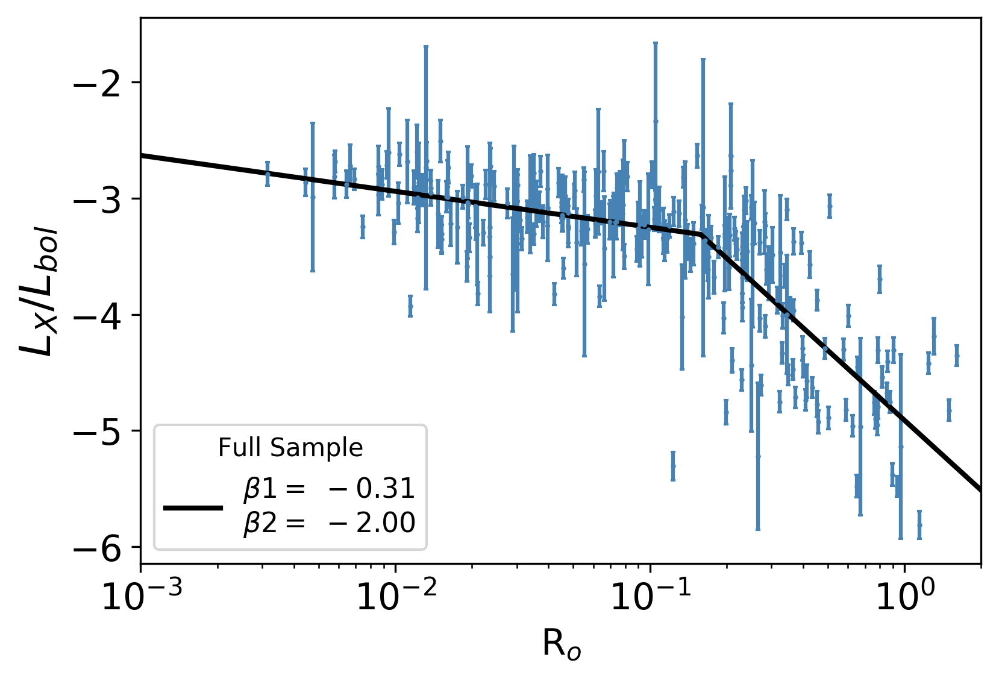

In [21]:
# Decide on your starting parameters
start_p = np.asarray([-4.75, 0.15, -0.15, -2.0, -2.3])

# run the emcee wrapper function -- include all data (including lower limits)
samples = run_dual_fit_constrained(start_p, np.asarray(FinalRossbys['Ro_CS11'][detections]), np.asarray(FinalRossbys['LxLbol'][detections]), np.asarray(FinalRossbys['eLxLbol'][detections]), -2.03, -1.97)
#returns: sat = -3.09, turnover = 0.078, beta = -1.54

# run the emcee wrapper function -- include just detections (exclude lower limits)
#samples = run_rossby_fit(start_p, np.asarray(dataTable['Ro'][detections]), np.asarray(dataTable['LxLbol_TRUE'][detections]), np.asarray(dataTable['e_LxLbol_KRC_use'][detections]) )
#returns: sat = -3.09, turnover = 0.079, beta = -1.57

# Plot the output
plot_dual_fit(samples, np.asarray(FinalRossbys['Ro_CS11'][detections]), np.asarray(FinalRossbys['LxLbol'][detections]), np.asarray(FinalRossbys['eLxLbol'][detections]) , plotfilename = 'enza_CranmerSaar2011_dual_fit_constrained.png', sampleName = 'Full Sample')

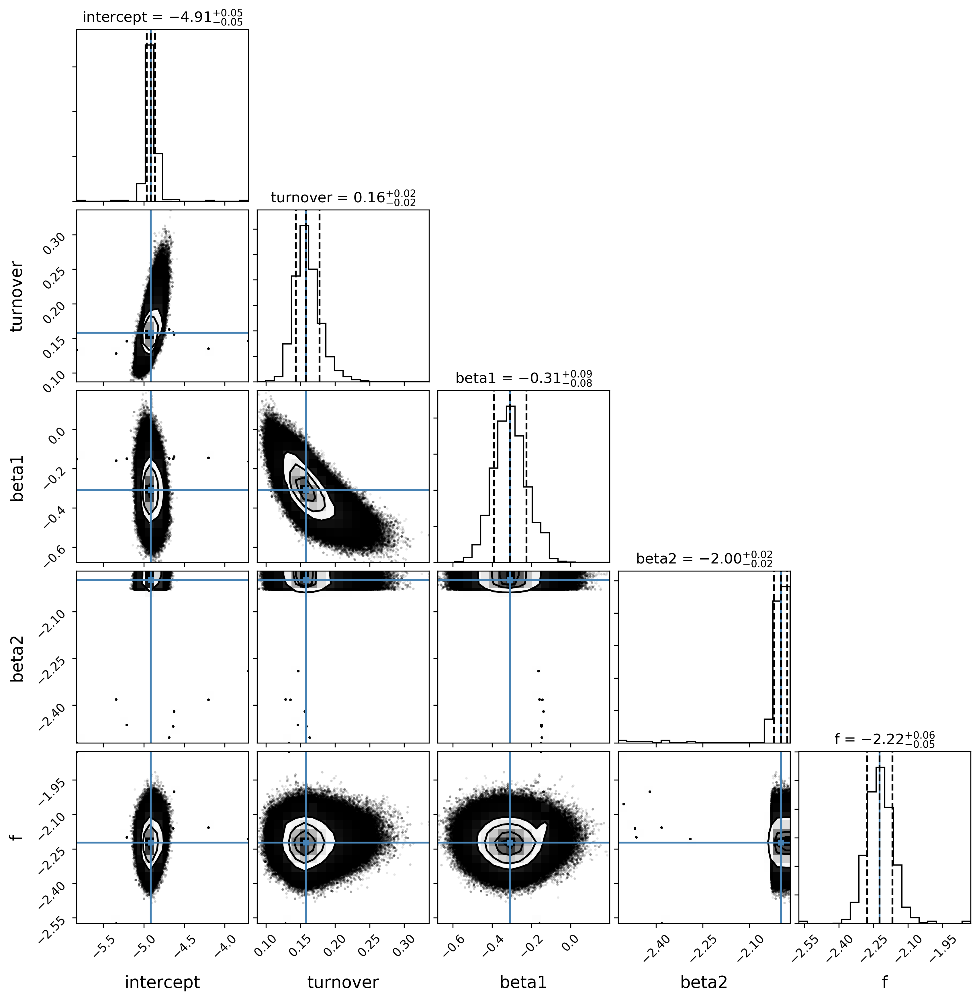

In [22]:
# Make a triangle plot 

# Set up the parameters of the problem.
ndim, nsamples = 5, len(samples) 

ic_mcmc = quantile(samples[:,0],[.16,.5,.84])
to_mcmc = quantile(samples[:,1],[.16,.5,.84])
beta1_mcmc = quantile(samples[:,2],[.16,.5,.84])
beta2_mcmc = quantile(samples[:,3],[.16,.5,.84])
var_mcmc = quantile(samples[:,4],[.16,.5,.84])

bestFit = [ic_mcmc[1][1], to_mcmc[1][1], beta1_mcmc[1][1], beta2_mcmc[1][1], var_mcmc[1][1]]

# Plot it.
figure = corner.corner(samples, labels=['intercept','turnover','beta1', 'beta2', 'f'],
                       quantiles=[0.16, 0.5, 0.84],
                       show_titles=True, title_kwargs={"fontsize": 12}, truths = bestFit)

# Uncomment to save the plot
plt.savefig('enza_CranmerSaar2011_dual_fit_corner_constrained.png')

## Original Rossby analysis

In [ ]:
#identify the true detections and the upper limits in the dataset
upperlimits = np.where(dataTable['UpperLimit'] == 1)
detections = np.where(dataTable['UpperLimit'] == 0)

#plot Enza's data
plt.scatter(dataTable['Ro'][detections], dataTable['LxLbol'][detections], marker = '.')
plt.errorbar(dataTable['Ro'][detections], dataTable['LxLbol'][detections], dataTable['eLxLbol'][detections], fmt = '.')
plt.scatter(dataTable['Ro'][upperlimits], dataTable['LxLbol'][upperlimits], marker = 'v')

plt.xscale('log')
#plt.yscale('log')
xlabel = plt.xlabel('Rossby #') 
ylabel = plt.ylabel('Log Lx/Lbol')
plt.axis([10**(-2),3.5,-6,-2])

#check that the log version of the model function is working by calculating model values 
#for the set of fake Rossby's that we created to test the Wright Data
fake_Log_lxlbols_shallow = rossby_model_log([-3.23, 0.08, -1.625], fake_rossbys)
plt.scatter(fake_rossbys, fake_Log_lxlbols_shallow, marker = '.', color = 'green')
fake_Log_lxlbols_steep = rossby_model_log([-3.23, 0.13, -1.66], fake_rossbys)
plt.scatter(fake_rossbys, fake_Log_lxlbols_steep, marker = '.', color = 'red')

plt.savefig('enza_rossby.png', bbox_inches='tight') 

In [ ]:
#plot Enza's data
plt.scatter(dataTable['Prot[d]'][detections], dataTable['Lx[erg/s]'][detections], marker = '.')
plt.errorbar(dataTable['Prot[d]'][detections], dataTable['Lx[erg/s]'][detections], dataTable['eLx[erg/s]'][detections], fmt = '.')
plt.scatter(dataTable['Prot[d]'][upperlimits], dataTable['Lx[erg/s]'][upperlimits], marker = 'v')

plt.xscale('log')
#plt.yscale('log')
xlabel = plt.xlabel(r'P$_{rot}$ [d]') 
ylabel = plt.ylabel(r'Log L$_x$')
plt.axis([0.1,175,25,31.2])

##check that the log version of the model function is working by calculating model values 
##for the set of fake Rossby's that we created to test the Wright Data
#fake_Log_lxlbols_shallow = rossby_model_log([-3.23, 0.08, -1.625], fake_rossbys)
#plt.scatter(fake_rossbys, fake_Log_lxlbols_shallow, marker = '.', color = 'green')
#fake_Log_lxlbols_steep = rossby_model_log([-3.23, 0.13, -1.66], fake_rossbys)
#plt.scatter(fake_rossbys, fake_Log_lxlbols_steep, marker = '.', color = 'red')

plt.savefig('enza_Prot_Lx.png', bbox_inches='tight') 

In [ ]:
#class ExpressionSet(RS4):
#    def _mean_get(self):
#        return self.slots['mean']
#    def _mean_set(self, value):
#        self.slots['mean'] = value
#    exprs = property(_mean_get,
#                     _mean_set,
#                     None,
#                     "R attribute `mean`")
    
#def the_mean(eset,
#               na_rm=False):
#    res = cenfit.mean(eset,
#                             na_rm=na_rm)
#    return res

In [ ]:
#make a function to do the binning for Enza
def EnzaBins(rossbys, fluxes, fluxFlags, saturatedFlag):

    # import R's "base" package
    base = importr('base')

    # import R's "utils" package
    utils = rpackages.importr('utils') # import R's utility package

    #install NADA once, then just import
    #utils.install_packages('NADA')
    utils.chooseCRANmirror(ind=1) # select the first CRAN mirror in the list for downloading packages
    nada = rpackages.importr('NADA') # import R's utility package

    #my_namespace = dict()
    #dispatch = partial(dispatch, namespace=my_namespace)

    #@dispatch(ExpressionSet)
    
    #now load the cenken package that we want to use to calculate the means
    cenfit = robjects.r['cenfit']
    
    #use the saturated flag to set the boundaries
    if saturatedFlag == True:
        lowerboundaries = [0.0011, 0.0127, 0.0257, 0.0615]
        upperboundaries = [0.0127, 0.0257, 0.0615, 0.120]
    else:
        lowerboundaries = [0.120, 0.228, 0.365, 0.70]
        upperboundaries = [0.228, 0.365, 0.70, 1.665]

    #count the bins we have and set up arrays for storing the results
    n_bins = len(lowerboundaries)
    mean_rossbys = []
    mean_fluxes = []
    
    #loop through the rossbys, fluxes and flags, and find the objects in this bin.
    for i in range(n_bins):
        theserossbys = np.asarray(rossbys[ (rossbys > lowerboundaries[i]) & (rossbys <= upperboundaries[i]) ])
        thesefluxes = np.asarray(-1.* fluxes[ (rossbys > lowerboundaries[i]) & (rossbys <= upperboundaries[i]) ])
        #print(thesefluxes)
        thesefluxflags = np.asarray(fluxFlags[ (rossbys > lowerboundaries[i]) & (rossbys <= upperboundaries[i]) ])
        #print(thesefluxflags)

        #calculate the mean rossby number for objects in the bin
        mean_rossbys = np.append(mean_rossbys, np.mean(theserossbys))
        mean_fluxes_check = np.mean(thesefluxes)
        #create cenken objects to do the KM mean calculation
        fluxes_forMean = robjects.FloatVector(thesefluxes)
        flags_forMean = robjects.BoolVector(thesefluxflags)
    
        cenfit_forMean = cenfit(fluxes_forMean, flags_forMean)
        #print(tuple(cenfit_forMean.slots.keys()))
        print(mean_rossbys[i], mean_fluxes_check)
        print(cenfit_forMean)
        #tuple(cenfit_forMean.slotnames())
        #thisMean = cenfit_forMean.slots['mean']
        #tuple(cenfit_forMean.mean())
        
        #mean(cenfit_forMean)
        #the_mean = cenfit_forMean.mean()
        #mean_fluxes = np.append(mean_fluxes, np.asarray(thisMean))
    
    return mean_rossbys, mean_fluxes

In [ ]:
#create arrays where we can save a boolean flag to indicate if the source is an upper limit
num_sources = len(np.asarray(dataTable['UpperLimit']))
RossbyFlag = np.full(num_sources, False)
UpperLimitFlag = np.full(num_sources, False)
UpperLimitFlag[upperlimits] = True

#since we just care about beta, let's truncate the data at R_o = 0.08 so that we can fit one line
fast_rossbys = dataTable['Ro'][(np.asarray(dataTable['Ro']) <= 0.12)]
fast_fluxes = dataTable['LxLbol'][(np.asarray(dataTable['Ro']) <= 0.12)]
fast_rossby_flag = RossbyFlag[((np.asarray(dataTable['Ro']) <= 0.12))]
fast_upperLimit_flag = UpperLimitFlag[((np.asarray(dataTable['Ro']) <= 0.12))]

plt.scatter(fast_rossbys, fast_fluxes, marker = 'o', s = 15, c='blue')

fast_rossby_bins, fast_flux_means = EnzaBins(fast_rossbys, fast_fluxes, fast_upperLimit_flag, True)
fast_rossby_means = [0.008, 0.019, 0.04, 0.088]
fast_flux_means = [-2.99, -3.13, -3.18, -3.15]
fast_flux_sds = [0.34, 0.275, 0.31, 0.26]/np.sqrt(36)

#since we just care about beta, let's truncate the data at R_o = 0.08 so that we can fit one line
slow_rossbys = dataTable['Ro'][(np.asarray(dataTable['Ro']) > 0.12)]
slow_fluxes = dataTable['LxLbol'][(np.asarray(dataTable['Ro']) > 0.12)]
slow_rossby_flag = RossbyFlag[((np.asarray(dataTable['Ro']) > 0.12))]
slow_upperLimit_flag = UpperLimitFlag[((np.asarray(dataTable['Ro']) > 0.12))]

#double-check that this worked by making a plot that shows just the slowly rotating detections and limits
plt.scatter(slow_rossbys, slow_fluxes, marker = 'o', s = 15, c='magenta')

#bin the data as Enza did, and use it to calculate the mean Lx/Lbol values in each bin.
slow_rossby_bins, slow_flux_means = EnzaBins(slow_rossbys, slow_fluxes, slow_upperLimit_flag, False)
#note! can't figure out how to access data from the R object, but I give up -- just transcribe it!
slow_rossby_means = [0.17, 0.29, 0.49, 1.03]
slow_flux_means = [-3.36, -3.89, -4.26, -4.6]
slow_flux_sds = [0.41, 0.62, 0.56, 0.54]/np.sqrt(39)
#cutting at 0.13 changes the first bin to Ro = 0.156  and -3.45

#
fitBins = rossby_model_log([-3.09, 0.078, -1.53], fake_rossbys)
plt.scatter(fake_rossbys, fitBins, marker = '.', color = 'red')
fitBins_steeper = rossby_model_log([-3.09, 0.078, -1.66], fake_rossbys)
plt.scatter(fake_rossbys, fitBins_steeper, marker = '.', color = 'green')

plt.scatter(fast_rossby_bins, fast_flux_means, marker = 'D', s = 30, c='cyan')

#and overlay on the plot
plt.scatter(slow_rossby_means, slow_flux_means, marker = 's', s = 30, c='orange')

plt.xscale('log')
xlabel = plt.xlabel('Rossby #') 
ylabel = plt.ylabel('Log Lx/Lbol')
plt.axis([10**(-2.5),3.5,-6,-2])

plt.savefig('test_upperlimits_rossby.png', bbox_inches='tight') 
#plt.clr()

In [ ]:
#create arrays where we can save a boolean flag to indicate if the source is an upper limit
num_sources = len(np.asarray(dataTable['UpperLimit']))
RossbyFlag = np.full(num_sources, False)
UpperLimitFlag = np.full(num_sources, False)
UpperLimitFlag[upperlimits] = True

#since we just care about beta, let's truncate the data at R_o = 0.08 so that we can fit one line
fast_rossbys = dataTable['Prot[d]'][(np.asarray(dataTable['Prot[d]']) <= 6)]
fast_fluxes = dataTable['Lx[erg/s]'][(np.asarray(dataTable['Prot[d]']) <= 6)]
fast_rossby_flag = RossbyFlag[((np.asarray(dataTable['Prot[d]']) <= 6))]
fast_upperLimit_flag = UpperLimitFlag[((np.asarray(dataTable['Prot[d]']) <= 6))]

plt.scatter(fast_rossbys, fast_fluxes, marker = 'o', s = 15, c='blue')

#fast_rossby_bins, fast_flux_means = EnzaBins(fast_rossbys, fast_fluxes, fast_upperLimit_flag, True)
#fast_rossby_means = [0.008, 0.019, 0.04, 0.088]
#fast_flux_means = [-2.99, -3.13, -3.18, -3.15]
#fast_flux_sds = [0.34, 0.275, 0.31, 0.26]/np.sqrt(36)

#since we just care about beta, let's truncate the data at R_o = 0.08 so that we can fit one line
slow_rossbys = dataTable['Prot[d]'][(np.asarray(dataTable['Prot[d]']) > 6)]
slow_fluxes = dataTable['Lx[erg/s]'][(np.asarray(dataTable['Prot[d]']) > 6)]
slow_rossby_flag = RossbyFlag[((np.asarray(dataTable['Prot[d]']) > 6))]
slow_upperLimit_flag = UpperLimitFlag[((np.asarray(dataTable['Prot[d]']) > 6))]


#double-check that this worked by making a plot that shows just the slowly rotating detections and limits
plt.scatter(slow_rossbys, slow_fluxes, marker = 'o', s = 15, c='magenta')

#bin the data as Enza did, and use it to calculate the mean Lx/Lbol values in each bin.
#slow_rossby_bins, slow_flux_means = EnzaBins(slow_rossbys, slow_fluxes, slow_upperLimit_flag, False)
#note! can't figure out how to access data from the R object, but I give up -- just transcribe it!
#slow_rossby_means = [0.17, 0.29, 0.49, 1.03]
#slow_flux_means = [-3.36, -3.89, -4.26, -4.6]
#slow_flux_sds = [0.41, 0.62, 0.56, 0.54]/np.sqrt(39)
#cutting at 0.13 changes the first bin to Ro = 0.156  and -3.45

#
#fitBins = rossby_model_log([-3.09, 0.078, -1.53], fake_rossbys)
#plt.scatter(fake_rossbys, fitBins, marker = '.', color = 'red')
#fitBins_steeper = rossby_model_log([-3.09, 0.078, -1.66], fake_rossbys)
#plt.scatter(fake_rossbys, fitBins_steeper, marker = '.', color = 'green')

#plt.scatter(fast_rossby_bins, fast_flux_means, marker = 'D', s = 30, c='cyan')

#and overlay on the plot
#plt.scatter(slow_rossby_means, slow_flux_means, marker = 's', s = 30, c='orange')

plt.xscale('log')
xlabel = plt.xlabel(r'P$_{rot}$ [d]') 
ylabel = plt.ylabel('Log Lx')
plt.axis([0.05,200,25,32])

plt.savefig('test_upperlimits_prot.png', bbox_inches='tight') 
#plt.clr()

In [ ]:
# Decide on your starting parameters
start_p = np.asarray([29.2, 6, -0.15, -1.7, 0.2])

# run the emcee wrapper function -- include all data (including lower limits)
samples = run_dual_fit_periods(start_p, np.asarray(dataTable['Prot[d]'][detections]), np.asarray(dataTable['Lx[erg/s]'][detections]), 0.2*np.ones(len(detections)) )
#returns: sat = -3.09, turnover = 0.078, beta = -1.54

# run the emcee wrapper function -- include just detections (exclude lower limits)
#samples = run_rossby_fit(start_p, np.asarray(dataTable['Ro'][detections]), np.asarray(dataTable['LxLbol_TRUE'][detections]), np.asarray(dataTable['e_LxLbol_KRC_use'][detections]) )
#returns: sat = -3.09, turnover = 0.079, beta = -1.57

# Plot the output
plot_dual_fit_periods(samples, np.asarray(dataTable['Prot[d]'][detections]), np.asarray(dataTable['Lx[erg/s]'][detections]), 0.2*np.ones(len(detections)), plotfilename = 'enza_datapoints_dual_fit_periods.png', sampleName = 'Full Sample')

In [ ]:
# Make a triangle plot 

# Set up the parameters of the problem.
ndim, nsamples = 5, len(samples) 

ic_mcmc = quantile(samples[:,0],[.16,.5,.84])
to_mcmc = quantile(samples[:,1],[.16,.5,.84])
beta1_mcmc = quantile(samples[:,2],[.16,.5,.84])
beta2_mcmc = quantile(samples[:,3],[.16,.5,.84])
var_mcmc = quantile(samples[:,4],[.16,.5,.84])

bestFit = [ic_mcmc[1][1], to_mcmc[1][1], beta1_mcmc[1][1], beta2_mcmc[1][1], var_mcmc[1][1]]

# Plot it.
figure = corner.corner(samples, labels=['intercept','turnover','beta1', 'beta2', 'f'],
                       quantiles=[0.16, 0.5, 0.84],
                       show_titles=True, title_kwargs={"fontsize": 12}, truths = bestFit)

# Uncomment to save the plot
plt.savefig('enza_datapoints_dual_fit_corner_periods.png')

In [ ]:
#now do a fit to the means with upper limits included
all_rossby_bins = np.append(fast_rossby_bins, slow_rossby_bins)
all_flux_means = np.append(fast_flux_means, slow_flux_means)
all_flux_sds = np.append(fast_flux_sds, slow_flux_sds)

plt.scatter(all_rossby_bins, all_flux_means, marker = 'D', s = 30, c='cyan')
plt.xscale('log')
xlabel = plt.xlabel('Rossby #') 
ylabel = plt.ylabel('Log Lx/Lbol')
#plt.axis([10**(-2.5),3.5,-6,-2])

try_fit = dual_power_law([-4.75, 0.15, -0.15, -1.7, 0.2],all_rossby_bins)
plt.scatter(all_rossby_bins, try_fit, linestyle = '-', s = 30, c='k')

plt.savefig('test_dual_fit_rossby.png', bbox_inches='tight') 

In [ ]:
# Decide on your starting parameters
start_p = np.asarray([-4.75, 0.15, -0.15, -1.7, 0.2])

# run the emcee wrapper function -- include all data (including lower limits)
samples = run_dual_fit(start_p, all_rossby_bins, all_flux_means, all_flux_sds )
#returns: sat = -3.09, turnover = 0.078, beta = -1.54

# run the emcee wrapper function -- include just detections (exclude lower limits)
#samples = run_rossby_fit(start_p, np.asarray(dataTable['Ro'][detections]), np.asarray(dataTable['LxLbol_TRUE'][detections]), np.asarray(dataTable['e_LxLbol_KRC_use'][detections]) )
#returns: sat = -3.09, turnover = 0.079, beta = -1.57

# Plot the output
plot_dual_fit(samples, all_rossby_bins, all_flux_means, all_flux_sds, plotfilename = 'enza_binned_dual_fit.png', sampleName = 'Full Sample')

In [ ]:
# Make a triangle plot 

# Set up the parameters of the problem.
ndim, nsamples = 5, len(samples) 

ic_mcmc = quantile(samples[:,0],[.16,.5,.84])
to_mcmc = quantile(samples[:,1],[.16,.5,.84])
beta1_mcmc = quantile(samples[:,2],[.16,.5,.84])
beta2_mcmc = quantile(samples[:,3],[.16,.5,.84])
var_mcmc = quantile(samples[:,4],[.16,.5,.84])

bestFit = [ic_mcmc[1][1], to_mcmc[1][1], beta1_mcmc[1][1], beta2_mcmc[1][1], var_mcmc[1][1]]

# Plot it.
figure = corner.corner(samples, labels=['intercept','turnover','beta1', 'beta2', 'f'],
                       quantiles=[0.16, 0.5, 0.84],
                       show_titles=True, title_kwargs={"fontsize": 12}, truths = bestFit)

# Uncomment to save the plot
plt.savefig('enza_binned_dual_fit_corner.png')

In [ ]:
# Decide on your starting parameters
start_p = np.asarray([-4.75, 0.15, -0.15, -1.7, 0.2])

# run the emcee wrapper function -- include all data (including lower limits)
samples = run_dual_fit(start_p, np.asarray(dataTable['Ro'][detections]), np.asarray(dataTable['LxLbol'][detections]), np.asarray(dataTable['e_LxLbol'][detections]) )
#returns: sat = -3.09, turnover = 0.078, beta = -1.54

# run the emcee wrapper function -- include just detections (exclude lower limits)
#samples = run_rossby_fit(start_p, np.asarray(dataTable['Ro'][detections]), np.asarray(dataTable['LxLbol_TRUE'][detections]), np.asarray(dataTable['e_LxLbol_KRC_use'][detections]) )
#returns: sat = -3.09, turnover = 0.079, beta = -1.57

# Plot the output
plot_dual_fit(samples, np.asarray(dataTable['Ro'][detections]), np.asarray(dataTable['LxLbol'][detections]), np.asarray(dataTable['e_LxLbol'][detections]), plotfilename = 'enza_datapoints_dual_fit.png', sampleName = 'Full Sample')

In [ ]:
# Make a triangle plot 

# Set up the parameters of the problem.
ndim, nsamples = 5, len(samples) 

ic_mcmc = quantile(samples[:,0],[.16,.5,.84])
to_mcmc = quantile(samples[:,1],[.16,.5,.84])
beta1_mcmc = quantile(samples[:,2],[.16,.5,.84])
beta2_mcmc = quantile(samples[:,3],[.16,.5,.84])
var_mcmc = quantile(samples[:,4],[.16,.5,.84])

bestFit = [ic_mcmc[1][1], to_mcmc[1][1], beta1_mcmc[1][1], beta2_mcmc[1][1], var_mcmc[1][1]]

# Plot it.
figure = corner.corner(samples, labels=['intercept','turnover','beta1', 'beta2', 'f'],
                       quantiles=[0.16, 0.5, 0.84],
                       show_titles=True, title_kwargs={"fontsize": 12}, truths = bestFit)

# Uncomment to save the plot
plt.savefig('enza_datapoints_dual_fit_corner.png')

In [ ]:
#Confident that we've isolated the unsaturated regime, now save the vectors to 
#send to r (and convert rossbys to log space, since that is what we want to fit)
Enza_cenken_rossbys = robjects.FloatVector(np.log10(slow_rossbys) )
Enza_cenken_fluxes = robjects.FloatVector(slow_fluxes)
Enza_cenken_rossbyFlags = robjects.BoolVector(slow_rossby_flag)
Enza_cenken_FluxFlags = robjects.BoolVector(slow_upperLimit_flag)

#run the fit!
Enza_cenkenout = cenken(Enza_cenken_fluxes, Enza_cenken_FluxFlags, Enza_cenken_rossbys, Enza_cenken_rossbyFlags)
print(Enza_cenkenout)
# - this gives a fit of beta = -1.625 when cutting at 0.08
# - the slope is 1.66 when cutting at 0.13

In [ ]:
#### now try to fit Enza's data using my updated version of Stephanie's routine's
# Decide on your starting parameters
start_p = np.asarray([-3.2, 0.12, -1.875, -2])

# run the emcee wrapper function -- include all data (including lower limits)
samples = run_rossby_fit(start_p, np.asarray(dataTable['Ro']), np.asarray(dataTable['LxLbol']), np.asarray(dataTable['e_LxLbol']) )
#returns: sat = -3.09, turnover = 0.078, beta = -1.54

# run the emcee wrapper function -- include just detections (exclude lower limits)
#samples = run_rossby_fit(start_p, np.asarray(dataTable['Ro'][detections]), np.asarray(dataTable['LxLbol_TRUE'][detections]), np.asarray(dataTable['e_LxLbol_KRC_use'][detections]) )
#returns: sat = -3.09, turnover = 0.079, beta = -1.57

# Plot the output
plot_rossby_log(samples, np.asarray(dataTable['Ro']), np.asarray(dataTable['LxLbol']), np.asarray(dataTable['e_LxLbol']), plotfilename = 'enza_rossby_forced_slope_fit.png', sampleName = 'Full Sample')

In [ ]:
# Make a triangle plot 

# Set up the parameters of the problem.
ndim, nsamples = 4, len(samples) 

sl_mcmc = quantile(samples[:,0],[.16,.5,.84])
to_mcmc = quantile(samples[:,1],[.16,.5,.84])
be_mcmc = quantile(samples[:,2],[.16,.5,.84])
var_mcmc = quantile(samples[:,3],[.16,.5,.84])


bestFit = [sl_mcmc[1][1], to_mcmc[1][1], be_mcmc[1][1], var_mcmc[1][1]]

# Plot it.
figure = corner.corner(samples, labels=['sat_level (x10$^{-3}$)','turnover','beta', 'f'],
                       quantiles=[0.16, 0.5, 0.84],
                       show_titles=True, title_kwargs={"fontsize": 12}, truths = bestFit)


# Uncomment to save the plot
plt.savefig('enza_rossby_corner_forced_fit.png')

In [ ]:
#use the Jao Gap to divide the sample into full and partially convective stars
fully_convective = np.where(dataTable['Abs_Mks[mag]'] >= 6.7)
partially_convective = np.where(dataTable['Abs_Mks[mag]'] < 6.7)

#use the Jao Gap to divide the sample into full and partially convective stars
slow_fully_convective = np.where( (dataTable['Abs_Mks[mag]'] >= 6.7) & (dataTable['Ro'] >= 0.12) )
slow_partially_convective = np.where( (dataTable['Abs_Mks[mag]'] < 6.7) & (dataTable['Ro'] >= 0.12) )

#Confident that we've isolated the unsaturated regime, now save the vectors to 
#send to r (and convert rossbys to log space, since that is what we want to fit)
Enza_cenken_slow_fully_rossbys = robjects.FloatVector(np.log10(dataTable['Ro'][slow_fully_convective]) )
Enza_cenken_slow_fully_fluxes = robjects.FloatVector(dataTable['LxLbol'][slow_fully_convective])
Enza_cenken_slow_fully_rossbyFlags = robjects.BoolVector(RossbyFlag[slow_fully_convective])
Enza_cenken_slow_fully_FluxFlags = robjects.BoolVector(UpperLimitFlag[slow_fully_convective])

#run the fit!
Enza_slow_fully_cenkenout = cenken(Enza_cenken_slow_fully_fluxes, Enza_cenken_slow_fully_FluxFlags, Enza_cenken_slow_fully_rossbys, Enza_cenken_slow_fully_rossbyFlags)
print(Enza_slow_fully_cenkenout)
# - this gives a fit of beta = -1.625 when cutting at 0.08
# - the slope is 1.66 when cutting at 0.13

In [ ]:
#Confident that we've isolated the unsaturated regime, now save the vectors to 
#send to r (and convert rossbys to log space, since that is what we want to fit)
Enza_cenken_slow_partially_rossbys = robjects.FloatVector(np.log10(dataTable['Ro'][slow_partially_convective]) )
Enza_cenken_slow_partially_fluxes = robjects.FloatVector(dataTable['LxLbol'][slow_partially_convective])
Enza_cenken_slow_partially_rossbyFlags = robjects.BoolVector(RossbyFlag[slow_partially_convective])
Enza_cenken_slow_partially_FluxFlags = robjects.BoolVector(UpperLimitFlag[slow_partially_convective])

#run the fit!
Enza_slow_partially_cenkenout = cenken(Enza_cenken_slow_partially_fluxes, Enza_cenken_slow_partially_FluxFlags, Enza_cenken_slow_partially_rossbys, Enza_cenken_slow_partially_rossbyFlags)
print(Enza_slow_partially_cenkenout)

In [ ]:
#### now try to fit Enza's data using my updated version of Stephanie's routine's
# Decide on your starting parameters
start_p = np.asarray([-3.2, 0.15, -1.5, 0.2])

# run the emcee wrapper function -- include all data (including lower limits)
samples = run_rossby_fit(start_p, np.asarray(dataTable['Ro'][fully_convective]), np.asarray(dataTable['LxLbol'][fully_convective]), np.asarray(dataTable['e_LxLbol'][fully_convective]) )
#returns: sat = -3.09, turnover = 0.08, beta = -1.57
#plot the output
plot_rossby_log(samples, np.asarray(dataTable['Ro'][fully_convective]), np.asarray(dataTable['LxLbol'][fully_convective]), np.asarray(dataTable['e_LxLbol'][fully_convective]), plotfilename = 'enza_rossby_fit_fully_convective.png', sampleName = 'Fully Convective')

In [ ]:
# Make a triangle plot 

# Set up the parameters of the problem.
ndim, nsamples = 4, len(samples) 

sl_mcmc = quantile(samples[:,0],[.16,.5,.84])
to_mcmc = quantile(samples[:,1],[.16,.5,.84])
be_mcmc = quantile(samples[:,2],[.16,.5,.84])
var_mcmc = quantile(samples[:,3],[.16,.5,.84])


bestFit = [sl_mcmc[1][1], to_mcmc[1][1], be_mcmc[1][1], var_mcmc[1][1]]

# Plot it.
figure = corner.corner(samples, labels=['sat_level (x10$^{-3}$)','turnover','beta', 'f'],
                       quantiles=[0.16, 0.5, 0.84],
                       show_titles=True, title_kwargs={"fontsize": 12}, truths = bestFit)


# Uncomment to save the plot
plt.savefig('enza_rossby_corner_fully_convective.png')

In [ ]:
# run the emcee wrapper function -- include just detections (exclude lower limits)
samples = run_rossby_fit(start_p, np.asarray(dataTable['Ro'][partially_convective]), np.asarray(dataTable['LxLbol'][partially_convective]), np.asarray(dataTable['e_LxLbol'][partially_convective]) )
#returns: sat = -3.09, turnover = 0.08, beta = -1.57

# Plot the output
plot_rossby_log(samples, np.asarray(dataTable['Ro'][partially_convective]), np.asarray(dataTable['LxLbol'][partially_convective]), np.asarray(dataTable['e_LxLbol'][partially_convective]), plotfilename = 'enza_rossby_fit_partially_convective.png', sampleName = 'Partially Convective')

In [ ]:
# Make a triangle plot 

# Set up the parameters of the problem.
ndim, nsamples = 4, len(samples) 

sl_mcmc = quantile(samples[:,0],[.16,.5,.84])
to_mcmc = quantile(samples[:,1],[.16,.5,.84])
be_mcmc = quantile(samples[:,2],[.16,.5,.84])
var_mcmc = quantile(samples[:,3],[.16,.5,.84])


bestFit = [sl_mcmc[1][1], to_mcmc[1][1], be_mcmc[1][1], var_mcmc[1][1]]

# Plot it.
figure = corner.corner(samples, labels=['sat_level (x10$^{-3}$)','turnover','beta', 'f'],
                       quantiles=[0.16, 0.5, 0.84],
                       show_titles=True, title_kwargs={"fontsize": 12}, truths = bestFit)

# Uncomment to save the plot
plt.savefig('enza_rossby_corner_partially_convective.png')

In [ ]:
#divide the sample into other spectral type slices (using MKs from Kraus 2007)
effg = np.where( (dataTable['Mks_TRUE'] >= 2) & (dataTable['Mks_TRUE'] < 4) )
kays = np.where( (dataTable['Mks_TRUE'] >= 4) & (dataTable['Mks_TRUE'] < 5.18) )
early_ems = np.where( (dataTable['Mks_TRUE'] >= 5.18) & (dataTable['Mks_TRUE'] < 6.7) )

In [ ]:
#### now try to fit Enza's data using my updated version of Stephanie's routine's
# Decide on your starting parameters
start_p = np.asarray([-3.2, 0.15, -1.5, 0.2])

# run the emcee wrapper function -- include all data (including lower limits)
samples = run_rossby_fit(start_p, np.asarray(dataTable['Ro'][effg]), np.asarray(dataTable['LxLbol_TRUE'][effg]), np.asarray(dataTable['e_LxLbol_KRC_use'][effg]) )
#returns: sat = -3.13, turnover = 0.06, beta = -2.36
#plot the output
plot_rossby_log(samples, np.asarray(dataTable['Ro'][effg]), np.asarray(dataTable['LxLbol_TRUE'][effg]), np.asarray(dataTable['e_LxLbol_KRC_use'][effg]), plotfilename = 'enza_rossby_fit_effg.png', sampleName = 'FG stars')

In [ ]:
# Make a triangle plot 

# Set up the parameters of the problem.
ndim, nsamples = 4, len(samples) 

sl_mcmc = quantile(samples[:,0],[.16,.5,.84])
to_mcmc = quantile(samples[:,1],[.16,.5,.84])
be_mcmc = quantile(samples[:,2],[.16,.5,.84])
var_mcmc = quantile(samples[:,3],[.16,.5,.84])

bestFit = [sl_mcmc[1][1], to_mcmc[1][1], be_mcmc[1][1], var_mcmc[1][1]]

# Plot it.
figure = corner.corner(samples, labels=['sat_level (x10$^{-3}$)','turnover','beta', 'f'],
                       quantiles=[0.16, 0.5, 0.84],
                       show_titles=True, title_kwargs={"fontsize": 12}, truths = bestFit)


# Uncomment to save the plot
plt.savefig('enza_rossby_corner_effg.png')

In [ ]:
#### now try to fit Enza's data using my updated version of Stephanie's routine's
# Decide on your starting parameters
start_p = np.asarray([-3.2, 0.15, -1.5, 0.2])

# run the emcee wrapper function -- include all data (including lower limits)
samples = run_rossby_fit(start_p, np.asarray(dataTable['Ro'][kays]), np.asarray(dataTable['LxLbol_TRUE'][kays]), np.asarray(dataTable['e_LxLbol_KRC_use'][kays]) )
#returns: sat = -3.09, turnover = 0.08, beta = -1.57
#plot the output
plot_rossby_log(samples, np.asarray(dataTable['Ro'][kays]), np.asarray(dataTable['LxLbol_TRUE'][kays]), np.asarray(dataTable['e_LxLbol_KRC_use'][kays]), plotfilename = 'enza_rossby_fit_kays.jpg', sampleName = 'K stars')

# Make a triangle plot 

# Set up the parameters of the problem.
ndim, nsamples = 4, len(samples) 

sl_mcmc = quantile(samples[:,0],[.16,.5,.84])
to_mcmc = quantile(samples[:,1],[.16,.5,.84])
be_mcmc = quantile(samples[:,2],[.16,.5,.84])
var_mcmc = quantile(samples[:,3],[.16,.5,.84])

bestFit = [sl_mcmc[1][1], to_mcmc[1][1], be_mcmc[1][1], var_mcmc[1][1]]

# Plot it.
figure = corner.corner(samples, labels=['sat_level (x10$^{-3}$)','turnover','beta', 'f'],
                       quantiles=[0.16, 0.5, 0.84],
                       show_titles=True, title_kwargs={"fontsize": 12}, truths = bestFit)


# Uncomment to save the plot
plt.savefig('enza_rossby_corner_kays.png')

In [ ]:
#### now try to fit Enza's data using my updated version of Stephanie's routine's
# Decide on your starting parameters
start_p = np.asarray([-3.2, 0.15, -1.5, 0.2])

# run the emcee wrapper function -- include all data (including lower limits)
samples = run_rossby_fit(start_p, np.asarray(dataTable['Ro'][early_ems]), np.asarray(dataTable['LxLbol_TRUE'][early_ems]), np.asarray(dataTable['e_LxLbol_KRC_use'][early_ems]) )
#returns: sat = -3.09, turnover = 0.13, beta = -2.1
#plot the output
plot_rossby_log(samples, np.asarray(dataTable['Ro'][early_ems]), np.asarray(dataTable['LxLbol_TRUE'][early_ems]), np.asarray(dataTable['e_LxLbol_KRC_use'][early_ems]), plotfilename = 'enza_rossby_fit_earlyems.jpg', sampleName = 'Early M stars')

# Make a triangle plot 

# Set up the parameters of the problem.
ndim, nsamples = 4, len(samples) 

sl_mcmc = quantile(samples[:,0],[.16,.5,.84])
to_mcmc = quantile(samples[:,1],[.16,.5,.84])
be_mcmc = quantile(samples[:,2],[.16,.5,.84])
var_mcmc = quantile(samples[:,3],[.16,.5,.84])

bestFit = [sl_mcmc[1][1], to_mcmc[1][1], be_mcmc[1][1], var_mcmc[1][1]]

# Plot it.
figure = corner.corner(samples, labels=['sat_level (x10$^{-3}$)','turnover','beta', 'f'],
                       quantiles=[0.16, 0.5, 0.84],
                       show_titles=True, title_kwargs={"fontsize": 12}, truths = bestFit)


# Uncomment to save the plot
plt.savefig('enza_rossby_corner_earlyems.png')

In [ ]:
exponents = [0,0,1,1]

In [ ]:
print(np.mean(exponents))

In [ ]:
notexponents = [10**0, 10**0, 10**1, 10**1]

In [ ]:
print(np.log10(np.mean(notexponents)))

In [ ]:
print(np.log10(np.mean([10.**0.4,10.**0.6])))